In [94]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

In [95]:
def get_pca_2d(df, predict):
    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):
    pca_3d_object = prince.PCA(
        n_components=3,
        n_iter=3,
        rescale_with_mean=True,
        rescale_with_std=True,
        copy=True,
        check_input=True,
        engine='sklearn',
        random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(df, 
                        x='comp1', 
                        y='comp2', 
                        z='comp3',
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter(df, 
                        x='comp1', 
                        y='comp2', 
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


In [96]:
embedding_df = pd.read_csv('datasets/embeddings.csv')
rfm_df = pd.read_csv('datasets/rfm.csv')

In [97]:
embedding_df

,0,1,2,3,4,5,6,7,8,9,...,375,376,377,378,379,380,381,382,383,384
0,00012a2ce6f8dcda20d059ce98491703,-0.038762,0.027879,-0.056806,-0.023621,-0.040568,0.035482,0.068797,0.026956,0.049115,...,0.041669,-0.054465,-0.025089,0.029756,-0.037294,-0.091459,0.074171,-0.102517,0.053421,-0.063744
1,0001fd6190edaaf884bcaf3d49edf079,-0.043105,-0.003964,-0.052243,-0.016168,-0.038607,0.001079,0.050614,-0.005902,0.011935,...,0.058270,-0.070932,-0.028577,0.031204,-0.048543,-0.065858,0.057475,-0.089038,-0.006671,-0.051398
2,0004164d20a9e969af783496f3408652,-0.031797,0.000948,-0.069297,-0.031305,-0.045524,0.040947,0.072200,0.021584,0.034165,...,0.043550,-0.048600,-0.028348,0.019706,-0.035017,-0.093339,0.064013,-0.072831,0.024802,-0.039300
3,00050bf6e01e69d5c0fd612f1bcfb69c,-0.027262,0.012240,-0.065230,-0.025833,-0.062201,0.009239,0.056144,0.023251,0.051108,...,0.059891,-0.060279,-0.030576,0.025715,-0.027046,-0.071806,0.065685,-0.103062,0.019223,0.006308
4,00066ccbe787a588c52bd5ff404590e3,-0.031395,0.011204,-0.034244,-0.031085,-0.042369,0.026646,0.068405,0.018869,0.027558,...,0.056588,-0.054477,-0.029694,0.024588,-0.018230,-0.066969,0.054381,-0.088457,0.036441,-0.048533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40278,fff415b4c72e09483a25c15108c65d31,-0.018781,0.006459,-0.054206,-0.019308,-0.026239,0.047627,0.078391,0.005932,0.044506,...,0.037539,-0.059142,-0.020357,0.020659,-0.009788,-0.082838,0.073485,-0.081374,0.025766,-0.034009
40279,fff5169e583fd07fac9fec88962f189d,-0.028818,0.029209,-0.040623,-0.025782,-0.024960,0.031590,0.082400,0.006782,0.036032,...,0.039997,-0.034222,-0.024190,0.039126,-0.020316,-0.086599,0.086839,-0.088358,0.044941,-0.041277
40280,fff89c8ed4fcf69a823c1d149e429a0b,-0.012744,0.015325,-0.068160,-0.038316,-0.023548,0.029445,0.092593,0.022231,0.033755,...,0.020828,-0.045996,-0.015367,0.020124,-0.020044,-0.080330,0.062441,-0.088150,0.045945,-0.071011
40281,fffcb937e9dd47a13f05ecb8290f4d3e,-0.029467,0.023729,-0.048136,-0.030842,-0.022862,0.034476,0.081301,0.009539,0.028714,...,0.053756,-0.054988,-0.028811,0.028929,-0.021718,-0.095640,0.090493,-0.097459,0.057380,-0.019544


In [98]:
rfm_df

,customer_id,recency,frequency,monetary_value,avg_review_score,reviews
0,00012a2ce6f8dcda20d059ce98491703,293,1,114.74,1.0,Everything as expected
1,0001fd6190edaaf884bcaf3d49edf079,552,1,195.42,5.0,Very good
2,0004164d20a9e969af783496f3408652,510,1,71.80,1.0,Product lacks clear information.
3,00050bf6e01e69d5c0fd612f1bcfb69c,351,1,85.23,5.0,great product
4,00066ccbe787a588c52bd5ff404590e3,209,1,270.00,1.0,"Missing 3 chandeliers from my purchase, only o..."
...,...,...,...,...,...,...
40278,fff415b4c72e09483a25c15108c65d31,283,1,84.57,5.0,Product delivered ahead of time and everything...
40279,fff5169e583fd07fac9fec88962f189d,115,1,152.77,1.0,I change my opinion as soon as I receive the p...
40280,fff89c8ed4fcf69a823c1d149e429a0b,261,1,44.10,3.0,"The doorknob covers came wrong, the NF contain..."
40281,fffcb937e9dd47a13f05ecb8290f4d3e,171,1,91.91,5.0,"the product was delivered before the deadline,..."


Outliers

In [99]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

# Unsupervised Outlier Detection Using Empirical Cumulative Distribution Functions (ECOD)
clf = ECOD()
clf.fit(embedding_df.iloc[:, 1:])

out = clf.predict(embedding_df.iloc[:, 1:]) 
embedding_df["outliers"] = out
rfm_df["outliers"] = out

df_embedding_no_out = embedding_df[embedding_df["outliers"] == 0]
df_embedding_no_out = df_embedding_no_out.drop(["outliers"], axis = 1)

df_embedding_with_out = embedding_df.copy()
df_embedding_with_out = df_embedding_with_out.drop(["outliers"], axis = 1)

In [100]:
df_embedding_no_out.shape

(36254, 385)

In [101]:
df_embedding_with_out.shape

(40283, 385)

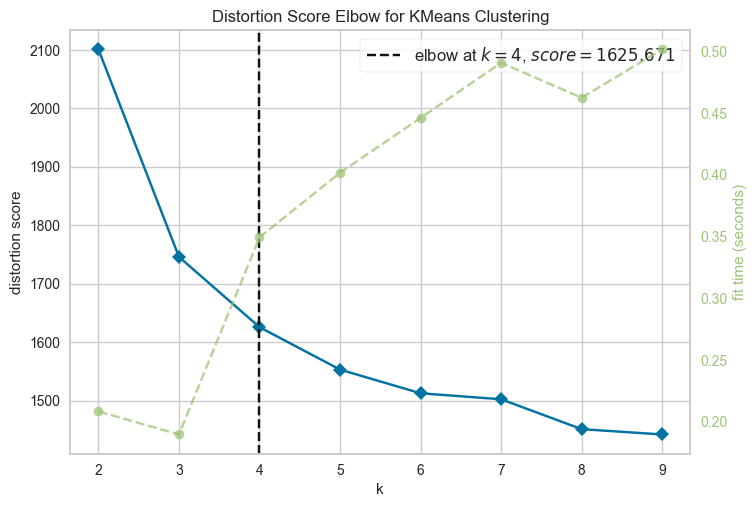

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [102]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=True)

visualizer.fit(df_embedding_with_out.iloc[:, 1:])        # Fit the data to the visualizer
visualizer.show()   

In [103]:
# def make_Silhouette_plot(X, n_clusters):
#     plt.xlim([-0.1, 1])
#     plt.ylim([0, len(X) + (n_clusters + 1) * 10])
#     clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
#     cluster_labels = clusterer.fit_predict(X)
#     silhouette_avg = silhouette_score(X, cluster_labels)
#     print(
#         "For n_clusters =", n_clusters,
#         "The average silhouette_score is :", silhouette_avg,
#     )
# # Compute the silhouette scores for each sample
#     sample_silhouette_values = silhouette_samples(X, cluster_labels)
#     y_lower = 10
#     for i in range(n_clusters):
#         ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#         ith_cluster_silhouette_values.sort()
#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i
#         color = cm.nipy_spectral(float(i) / n_clusters)
#         plt.fill_betweenx(
#             np.arange(y_lower, y_upper),
#             0,
#             ith_cluster_silhouette_values,
#             facecolor=color,
#             edgecolor=color,
#             alpha=0.7,
#         )
#         plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#         y_lower = y_upper + 10
#         plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
#         plt.xlabel("The silhouette coefficient values", fontsize=24)
#         plt.ylabel("Cluster label", fontsize=24)
#         plt.axvline(x=silhouette_avg, color="red", linestyle="--")
#         plt.yticks([])  
#         plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
# range_n_clusters = list(range(2,10))
# for n_clusters in range_n_clusters:
#     print(f"N cluster: {n_clusters}")
#     make_Silhouette_plot(df_embedding_no_out, n_clusters)   
#     plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
#     plt.close()

In [104]:
n_clusters = 3

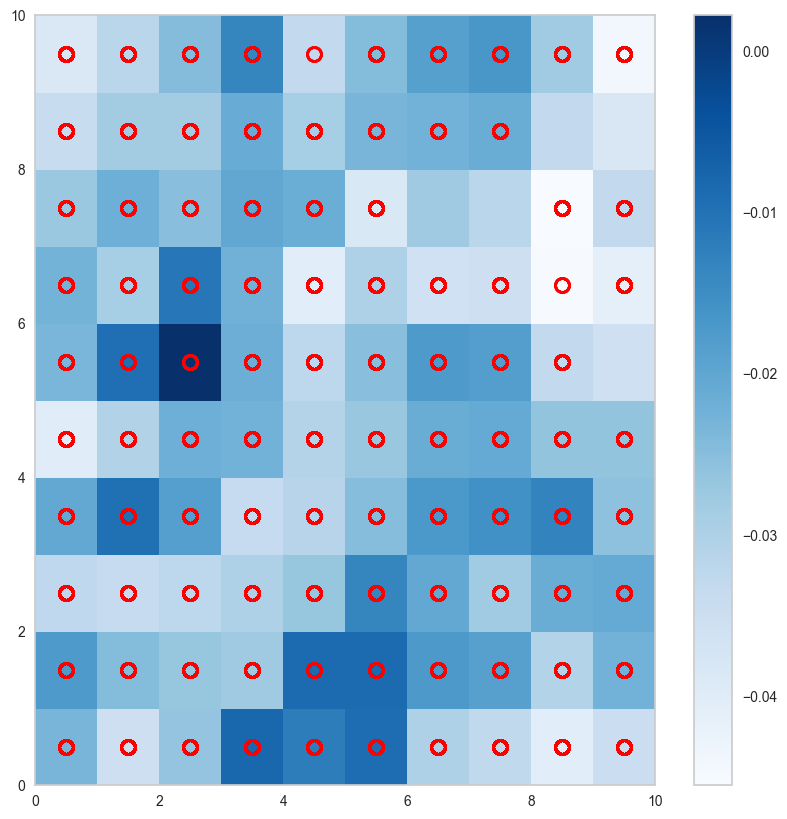

In [105]:
# self organizing map
from minisom import MiniSom

# select only the two columns that you want to use for clustering
data = df_embedding_no_out.iloc[:, 1:].values
som = MiniSom(x = 10, y = 10, input_len = data.shape[1], sigma = 1.0, learning_rate = 0.5)
som.train_random(data, 10000)

import matplotlib.pyplot as plt

# Get the SOM's weights
weights = som.get_weights()

# Plotting the clusters
plt.figure(figsize=(10, 10))
plt.pcolor(weights[:, :, 0], cmap='Blues')
plt.colorbar()

# Plotting the centroids
for i, j in enumerate(data):
    w = som.winner(j)
    plt.plot(w[0] + 0.5, w[1] + 0.5, 'o', markerfacecolor='None',
             markeredgecolor='red', markersize=10, markeredgewidth=2)
plt.show()

In [106]:
# Evaluating the model using the silhouette score
from sklearn.metrics import silhouette_score

labels = []
for i in range(len(data)):
    w = som.winner(data[i])
    labels.append(w)

labels = np.array(labels)
labels = labels[:, 0] + labels[:, 1] * 10

silhouette_score(data, labels)

0.04183872566339344

In [107]:
data

array([[-0.03876204,  0.02787916, -0.05680572, ..., -0.10251746,
         0.05342111, -0.06374431],
       [-0.04310457, -0.00396429, -0.05224345, ..., -0.08903841,
        -0.00667085, -0.05139812],
       [-0.0317973 ,  0.00094769, -0.06929659, ..., -0.07283121,
         0.02480219, -0.03930039],
       ...,
       [-0.01274412,  0.01532454, -0.06815965, ..., -0.08815048,
         0.04594502, -0.07101145],
       [-0.02946691,  0.02372925, -0.0481362 , ..., -0.09745856,
         0.05738033, -0.01954371],
       [-0.01598036,  0.01761953, -0.04706732, ..., -0.09151242,
         0.03695521, -0.03422844]])

--------------------------------------------------------------------------------------------------

In [449]:
clusters = KMeans(n_clusters=n_clusters, init = "k-means++").fit(df_embedding_no_out.iloc[:, 1:])
print(clusters.inertia_)
clusters_predict = clusters.predict(df_embedding_no_out.iloc[:, 1:])

C:\Users\Shamika Tissera\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



1172.0468686644867


In [450]:
clusters_predict

array([0, 1, 0, ..., 0, 1, 1])

In [451]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin Score: {davies_bouldin_score(df_embedding_no_out.iloc[:, 1:],clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(df_embedding_no_out.iloc[:, 1:],clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(df_embedding_no_out.iloc[:, 1:],clusters_predict)}")

Davies bouldin Score: 3.0411836346722194
Calinski Score: 3140.237254742945
Silhouette Score: 0.08354014876483185


In [452]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,375,376,377,378,379,380,381,382,383,384
0,00012a2ce6f8dcda20d059ce98491703,-0.036682,0.022261,-0.052962,-0.032157,-0.046619,0.032298,0.072550,0.022874,0.045551,...,0.051503,-0.048254,-0.023743,0.028232,-0.044087,-0.085411,0.075378,-0.100242,0.055640,-0.062575
1,0001fd6190edaaf884bcaf3d49edf079,-0.031187,0.010441,-0.051118,-0.014031,-0.019102,0.040090,0.069331,-0.006708,0.021199,...,0.056432,-0.039058,-0.018743,0.027542,-0.042914,-0.078848,0.064417,-0.090415,0.036070,-0.059718
2,0004164d20a9e969af783496f3408652,-0.035037,0.005081,-0.069729,-0.032379,-0.044434,0.041176,0.074382,0.018969,0.027204,...,0.047610,-0.046911,-0.025469,0.021999,-0.036863,-0.089312,0.073324,-0.074646,0.029357,-0.045624
3,00050bf6e01e69d5c0fd612f1bcfb69c,-0.021432,-0.008091,-0.064509,-0.034514,-0.025427,0.040508,0.074209,0.014365,0.031372,...,0.048979,-0.046289,-0.025237,0.026868,-0.027925,-0.091038,0.075604,-0.080789,0.047991,-0.038711
4,00066ccbe787a588c52bd5ff404590e3,-0.026024,0.011641,-0.042998,-0.036789,-0.041606,0.034732,0.073308,0.016597,0.029673,...,0.064519,-0.053023,-0.025605,0.027839,-0.034601,-0.069291,0.067847,-0.099682,0.034793,-0.045493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40278,fff415b4c72e09483a25c15108c65d31,-0.022279,0.004521,-0.051122,-0.027658,-0.032907,0.044924,0.081111,0.005286,0.039978,...,0.051175,-0.059772,-0.021069,0.019170,-0.014568,-0.078956,0.069542,-0.085651,0.022876,-0.041444
40279,fff5169e583fd07fac9fec88962f189d,-0.026706,0.029569,-0.039645,-0.035997,-0.028701,0.027865,0.079875,-0.000696,0.032880,...,0.047832,-0.028637,-0.026828,0.036092,-0.032239,-0.079794,0.093761,-0.090480,0.055324,-0.035406
40280,fff89c8ed4fcf69a823c1d149e429a0b,-0.014564,0.012215,-0.068017,-0.038049,-0.025013,0.031368,0.086637,0.018134,0.026666,...,0.032561,-0.049966,-0.015481,0.022524,-0.025905,-0.076928,0.074322,-0.092961,0.043320,-0.075042
40281,fffcb937e9dd47a13f05ecb8290f4d3e,-0.022806,0.020034,-0.049405,-0.037015,-0.024271,0.035485,0.084740,0.006137,0.024618,...,0.059751,-0.052223,-0.025844,0.027406,-0.020522,-0.089633,0.089418,-0.099648,0.051632,-0.024367


In [453]:
# df_embedding_no_out = df_embedding_no_out.iloc[:, 1:]


In [454]:
print(rfm_df.shape)
print(df_embedding_no_out.shape)

(40283, 7)
(36254, 385)


In [455]:
# compare the two dataframes customer ids and remove the ones that are not in the df_embedding_no_out dataframe
print(rfm_df.shape)
print(df_embedding_no_out.shape)

rfm_df = rfm_df[rfm_df["customer_id"].isin(df_embedding_no_out['0'])]
print(rfm_df.shape)



(40283, 7)
(36254, 385)
(36254, 7)


In [456]:
rfm_df["cluster"] = clusters_predict
rfm_df

C:\Users\Shamika Tissera\AppData\Local\Temp\ipykernel_34344\354568931.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,customer_id,recency,frequency,monetary_value,avg_review_score,reviews,outliers,cluster
0,00012a2ce6f8dcda20d059ce98491703,293,1,114.74,1.0,Everything as expected,0,0
1,0001fd6190edaaf884bcaf3d49edf079,552,1,195.42,5.0,Very good,0,1
2,0004164d20a9e969af783496f3408652,510,1,71.80,1.0,Product lacks clear information.,0,0
3,00050bf6e01e69d5c0fd612f1bcfb69c,351,1,85.23,5.0,great product,0,0
4,00066ccbe787a588c52bd5ff404590e3,209,1,270.00,1.0,"Missing 3 chandeliers from my purchase, only o...",0,0
...,...,...,...,...,...,...,...,...
40278,fff415b4c72e09483a25c15108c65d31,283,1,84.57,5.0,Product delivered ahead of time and everything...,0,0
40279,fff5169e583fd07fac9fec88962f189d,115,1,152.77,1.0,I change my opinion as soon as I receive the p...,0,1
40280,fff89c8ed4fcf69a823c1d149e429a0b,261,1,44.10,3.0,"The doorknob covers came wrong, the NF contain...",0,0
40281,fffcb937e9dd47a13f05ecb8290f4d3e,171,1,91.91,5.0,"the product was delivered before the deadline,...",0,1


In [457]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,375,376,377,378,379,380,381,382,383,384
0,00012a2ce6f8dcda20d059ce98491703,-0.036682,0.022261,-0.052962,-0.032157,-0.046619,0.032298,0.072550,0.022874,0.045551,...,0.051503,-0.048254,-0.023743,0.028232,-0.044087,-0.085411,0.075378,-0.100242,0.055640,-0.062575
1,0001fd6190edaaf884bcaf3d49edf079,-0.031187,0.010441,-0.051118,-0.014031,-0.019102,0.040090,0.069331,-0.006708,0.021199,...,0.056432,-0.039058,-0.018743,0.027542,-0.042914,-0.078848,0.064417,-0.090415,0.036070,-0.059718
2,0004164d20a9e969af783496f3408652,-0.035037,0.005081,-0.069729,-0.032379,-0.044434,0.041176,0.074382,0.018969,0.027204,...,0.047610,-0.046911,-0.025469,0.021999,-0.036863,-0.089312,0.073324,-0.074646,0.029357,-0.045624
3,00050bf6e01e69d5c0fd612f1bcfb69c,-0.021432,-0.008091,-0.064509,-0.034514,-0.025427,0.040508,0.074209,0.014365,0.031372,...,0.048979,-0.046289,-0.025237,0.026868,-0.027925,-0.091038,0.075604,-0.080789,0.047991,-0.038711
4,00066ccbe787a588c52bd5ff404590e3,-0.026024,0.011641,-0.042998,-0.036789,-0.041606,0.034732,0.073308,0.016597,0.029673,...,0.064519,-0.053023,-0.025605,0.027839,-0.034601,-0.069291,0.067847,-0.099682,0.034793,-0.045493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40278,fff415b4c72e09483a25c15108c65d31,-0.022279,0.004521,-0.051122,-0.027658,-0.032907,0.044924,0.081111,0.005286,0.039978,...,0.051175,-0.059772,-0.021069,0.019170,-0.014568,-0.078956,0.069542,-0.085651,0.022876,-0.041444
40279,fff5169e583fd07fac9fec88962f189d,-0.026706,0.029569,-0.039645,-0.035997,-0.028701,0.027865,0.079875,-0.000696,0.032880,...,0.047832,-0.028637,-0.026828,0.036092,-0.032239,-0.079794,0.093761,-0.090480,0.055324,-0.035406
40280,fff89c8ed4fcf69a823c1d149e429a0b,-0.014564,0.012215,-0.068017,-0.038049,-0.025013,0.031368,0.086637,0.018134,0.026666,...,0.032561,-0.049966,-0.015481,0.022524,-0.025905,-0.076928,0.074322,-0.092961,0.043320,-0.075042
40281,fffcb937e9dd47a13f05ecb8290f4d3e,-0.022806,0.020034,-0.049405,-0.037015,-0.024271,0.035485,0.084740,0.006137,0.024618,...,0.059751,-0.052223,-0.025844,0.027406,-0.020522,-0.089633,0.089418,-0.099648,0.051632,-0.024367


In [458]:
rfm_df.drop(["outliers"], axis = 1, inplace = True)

C:\Users\Shamika Tissera\AppData\Local\Temp\ipykernel_34344\3590736521.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [459]:
# plot the clusters in 3d
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_no_out.iloc[:, 1:], clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space with 3 Clusters", opacity=0.8, width_line = 0.1)

In [460]:
# calculate silhouette score
silhouette_score(df_embedding_no_out.iloc[:, 1:], clusters_predict)

0.08354014876483185

In [432]:
rfm_df

,customer_id,recency,frequency,monetary_value,avg_review_score,reviews,cluster
0,00012a2ce6f8dcda20d059ce98491703,293,1,114.74,1.0,Everything as expected,1
1,0001fd6190edaaf884bcaf3d49edf079,552,1,195.42,5.0,Very good,2
2,0004164d20a9e969af783496f3408652,510,1,71.80,1.0,Product lacks clear information.,1
4,00066ccbe787a588c52bd5ff404590e3,209,1,270.00,1.0,"Missing 3 chandeliers from my purchase, only o...",1
6,0010068a73b7c56da5758c3f9e5c7375,510,1,54.83,5.0,good myth,1
...,...,...,...,...,...,...,...
40278,fff415b4c72e09483a25c15108c65d31,283,1,84.57,5.0,Product delivered ahead of time and everything...,1
40279,fff5169e583fd07fac9fec88962f189d,115,1,152.77,1.0,I change my opinion as soon as I receive the p...,1
40280,fff89c8ed4fcf69a823c1d149e429a0b,261,1,44.10,3.0,"The doorknob covers came wrong, the NF contain...",1
40281,fffcb937e9dd47a13f05ecb8290f4d3e,171,1,91.91,5.0,"the product was delivered before the deadline,...",1


In [433]:
# import plotly.express as px

# # plot the clusters for rfm_df
# fig = px.scatter_3d(rfm_df,
#                     x = "Recency",
#                     y = "Frequency",
#                     z = "MonetaryValue",
#                     template="plotly",
#                     color_discrete_sequence=px.colors.qualitative.Vivid,
#                     title = "Clusters for RFM",
#                     opacity=0.8,
#                     width = 1000, 
#                     height = 800, 
#                     )
# fig.update_layout(showlegend=True,
#                   scene = dict(xaxis=dict(title = 'Recency', titlefont_color = 'black'),
#                                yaxis=dict(title = 'Frequency', titlefont_color = 'black'),
#                                zaxis=dict(title = 'MonetaryValue', titlefont_color = 'black')),
#                   font = dict(family = "Gilroy", color  = 'black', size = 15),
#                   autosize = False, 
#                   legend=dict(title_font_family="Times New Roman",
#                               font=dict(size= 20)))
# fig.show()


In [434]:
# # calculate the silhouette score for the rfm_df
# silhouette_score(rfm_df.iloc[:, 1:-1], clusters_predict)

In [435]:
# pca_3d_object, df_pca_3d = get_pca_3d(rfm_df.iloc[:, 1:], clusters_predict)
# plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
# # %pip install nbformat
# print("The variability is :", pca_3d_object.eigenvalues_summary)

In [436]:
# plot the clusters in 3d
df_pca_3d

,comp1,comp2,comp3,cluster
0,-0.102080,-2.166357,5.528361,1
1,17.885884,-10.803147,-4.939401,2
2,0.815046,-2.326300,1.475264,1
4,0.533259,-6.496562,5.141756,1
6,-1.375335,-3.684102,0.414981,1
...,...,...,...,...
40278,-3.097301,-2.179258,1.818654,1
40279,-3.844586,0.198363,0.059804,1
40280,-4.410276,-0.936438,5.746968,1
40281,-4.055147,-0.724684,1.914909,1


In [437]:
pca_2d_object, df_pca_2d = get_pca_2d(rfm_df.iloc[:, 1:], clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.2)


ValueError: could not convert string to float: 'Everything as expected'

In [42]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data.iloc[:, 1:])

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=1, width_line = 0.1)

KeyboardInterrupt: 

In [ ]:
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=0.1, width_line = 0.1)

In [ ]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=0.5, width_line = 0.5)


ValueError: could not convert string to float: 'df913529b303b9222440b3ea06e2cd1e'

In [ ]:
plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=1, width_line = 0.5)


In [ ]:
df_no_outliers = rfm_df[rfm_df["outliers"] == 0]
df_no_outliers = df_no_outliers.drop("outliers", axis = 1)

In [ ]:
import pandas as pd
import lightgbm as lgb
import shap

clf_km = lgb.LGBMClassifier(colsample_by_tree=0.8)

for col in ["Recency", "Frequency", "MonetaryValue"]:
    df_no_outliers[col] = df_no_outliers[col].astype('category')

clf_km.fit(X = df_no_outliers.iloc[:, 1:] , y = clusters_predict)

#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(df_no_outliers)
shap.summary_plot(shap_values_km, df_no_outliers, plot_type="bar", plot_size=(15, 10))

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9662
[LightGBM] [Info] Number of data points in the train set: 88798, number of used features: 3
[LightGBM] [Info] Start training from score -0.137894
[LightGBM] [Info] Start training from score -2.566798
[LightGBM] [Info] Start training from score -2.955969


ValueError: pandas dtypes must be int, float or bool.
Fields with bad pandas dtypes: customer_id: object

In [ ]:
y_pred = clf_km.predict(df_no_outliers)
accuracy=accuracy_score(y_pred, clusters_predict)
print('Training-set accuracy score: {0:0.4f}'. format(accuracy))
print(classification_report(clusters_predict, y_pred))

In [ ]:
df_no_outliers["cluster"] = clusters_predict

df_group = df_no_outliers.groupby('cluster').agg(
    {
        'Recency': lambda x: x.value_counts().index[0],
        'Frequency': lambda x: x.value_counts().index[0],
        'Monetary Value': lambda x: x.value_counts().index[0]        
    }
).       sort_values("").reset_index()
df_group